In [1]:
%matplotlib inline
# This script allows to visualize the results of the generated labels

import sys, os

import matplotlib.pyplot as plt
import json

from label_writer import LabelWriter

In [26]:
# run a python script (box_generator.py) with arguments and capture the output
import subprocess
# output = subprocess.check_output("python box_generator.py -h", shell=True)
# print("output: ", output)

output:  b'usage: box_generator.py [-h] [-p DATA_PATH] [-s SEQ_IDS [SEQ_IDS ...]]\r\n                        [-d DATA_NAME [DATA_NAME ...]] [-o OUTPUT_PATH] [-v]\r\n                        [-x] [-n NUM_LABELS] [-f MIN_SHARED_FEATURES]\r\n\r\nExtract images and GPS from a rosbag.\r\n\r\noptional arguments:\r\n  -h, --help            show this help message and exit\r\n  -p DATA_PATH, --data_path DATA_PATH\r\n                        The path to the data folder\r\n  -s SEQ_IDS [SEQ_IDS ...], --seq-ids SEQ_IDS [SEQ_IDS ...]\r\n                        Selected sequence IDs for which to generate labels, or\r\n                        -1 for all static sequences\r\n  -d DATA_NAME [DATA_NAME ...], --data_name DATA_NAME [DATA_NAME ...]\r\n                        The name of the folders for which labels should be\r\n                        generated\r\n  -o OUTPUT_PATH, --output_path OUTPUT_PATH\r\n                        The path where to save the outputs\r\n  -v, --visualize       Whether to vis

In [2]:
annotation_file_name = "generation_test_annotations.json"

label_writer = LabelWriter()

# read the labels, if they exist
if os.path.isfile(annotation_file_name):
    # label_reader = LabelReader(annotation_file_name)
    # labels = label_reader.labels
    with open(annotation_file_name, "r") as f:
        labels = json.load(f)
    label_writer.annotation_dict = labels
    print("labels loaded")

labels loaded


In [3]:
print("labels:", label_writer.annotation_dict)

labels: {'licenses': [{'name': '', 'id': 0, 'url': ''}], 'info': {'contributor': '', 'date_created': '', 'description': '', 'url': '', 'version': '', 'year': ''}, 'categories': [{'id': 1, 'name': 'positive', 'supercategory': ''}], 'images': [{'id': 1, 'width': 1280, 'height': 720, 'file_name': '../outputs/2022_01_21_14_04/2022_01_21_14_04/images/camera5/1642799632_699856445.jpg', 'license': 0, 'flickr_url': '', 'coco_url': '', 'date_captured': 0}, {'id': 2, 'width': 1280, 'height': 720, 'file_name': '../outputs/2022_01_21_14_04/2022_01_21_14_04/images/camera5/1642804023_295219438.jpg', 'license': 0, 'flickr_url': '', 'coco_url': '', 'date_captured': 0}, {'id': 3, 'width': 1280, 'height': 720, 'file_name': '../outputs/2022_01_21_14_04/2022_01_21_14_04/images/camera5/1642802058_700671735.jpg', 'license': 0, 'flickr_url': '', 'coco_url': '', 'date_captured': 0}, {'id': 4, 'width': 1280, 'height': 720, 'file_name': '../outputs/2022_01_21_14_04/2022_01_21_14_04/images/camera3/1642793686_823

image:  1642799632_699856445.jpg


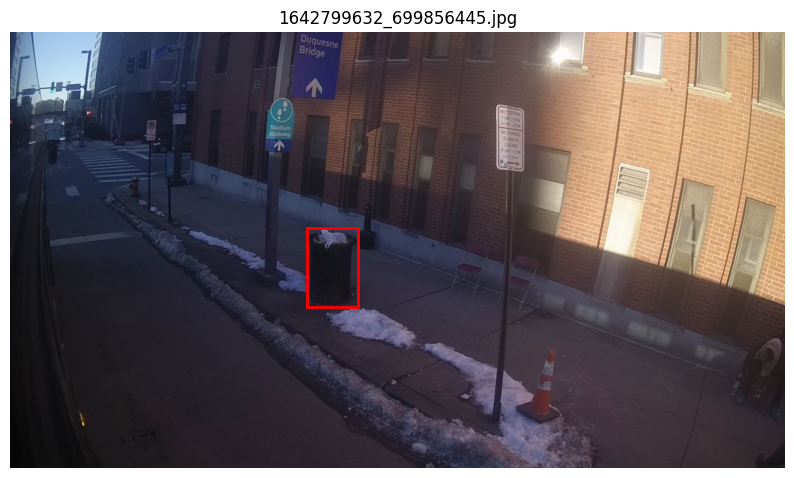

image:  1642804023_295219438.jpg


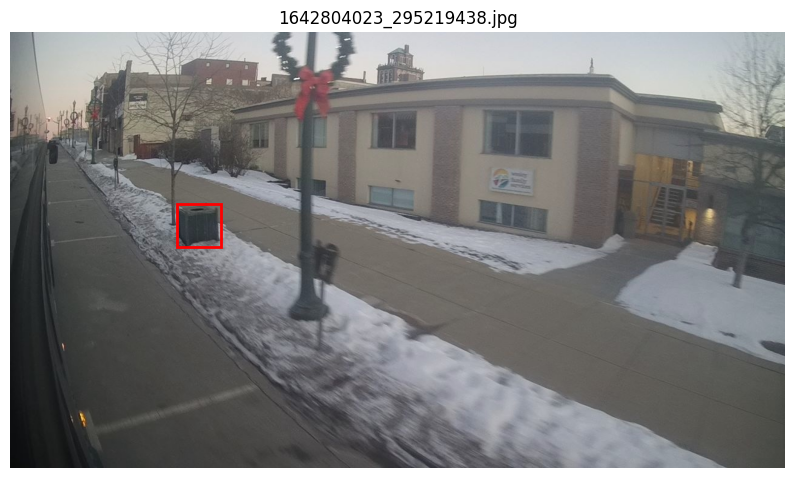

image:  1642802058_700671735.jpg


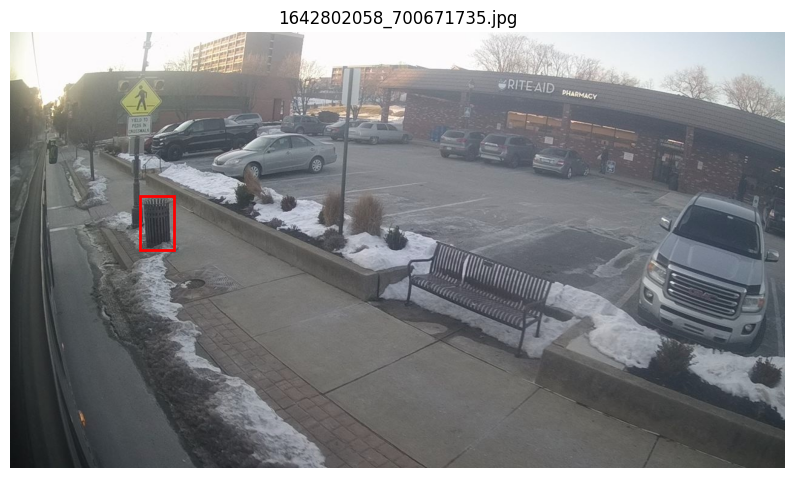

image:  1642793686_823300842.jpg


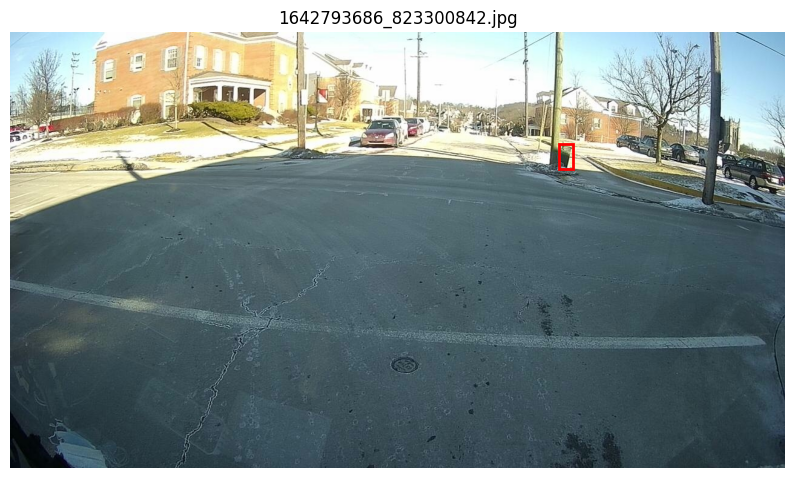

image:  1642804403_499410972.jpg


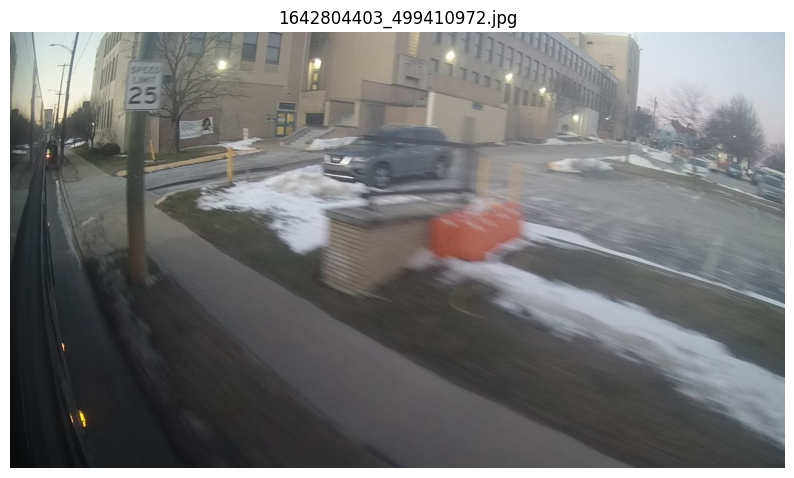

image:  1642795257_899259814.jpg


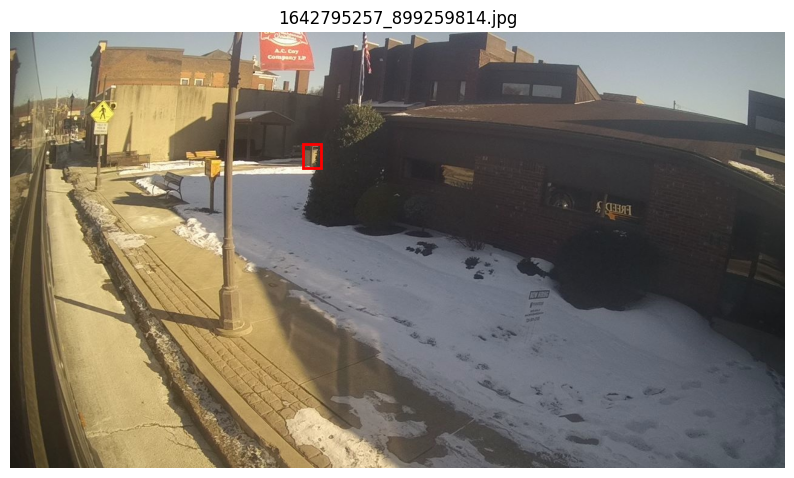

image:  1642795267_101047645.jpg


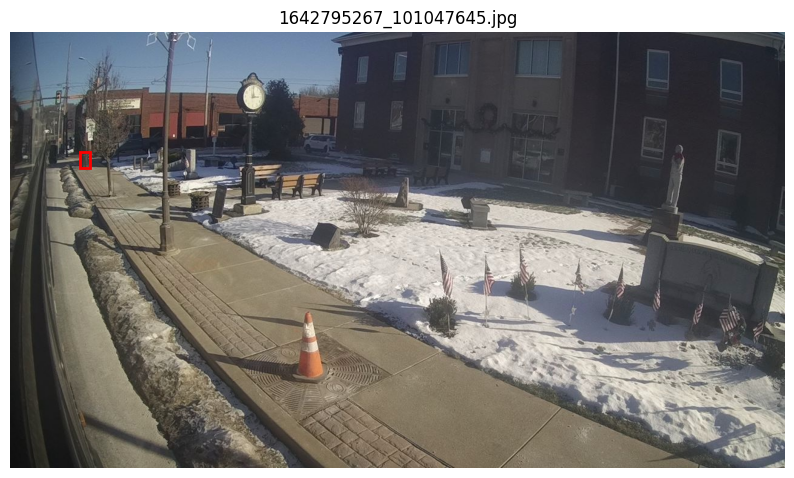

image:  1642795261_622810749.jpg


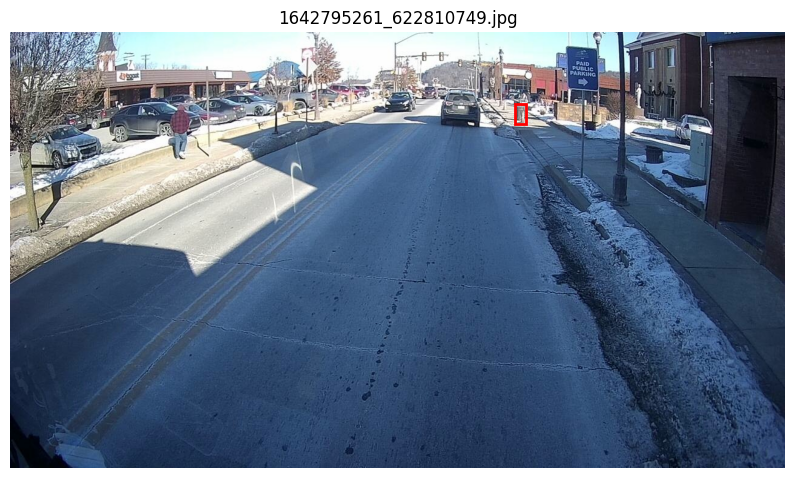

image:  1642797285_224633239.jpg


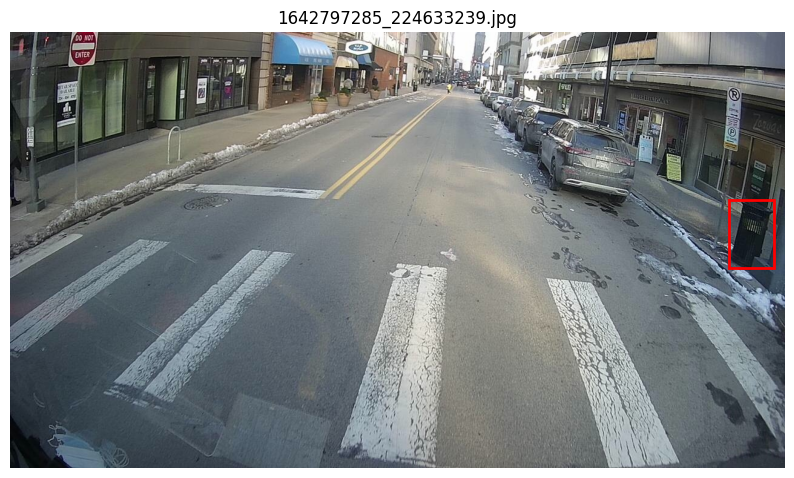

image:  1642799008_295515473.jpg


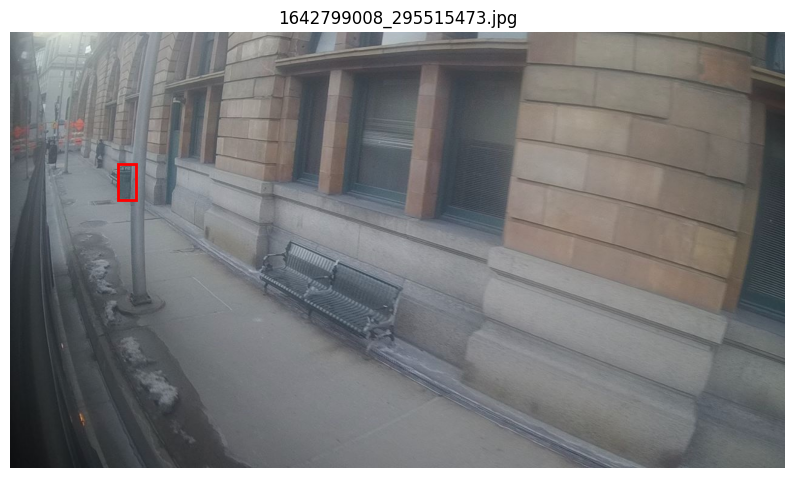

image:  1642799008_099713063.jpg


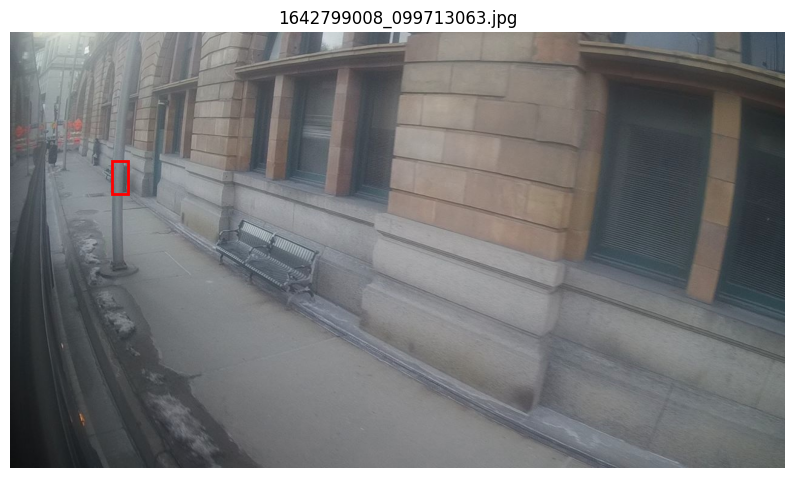

In [4]:
if True:
    # Show the labels
    for image in label_writer.annotation_dict["images"]:
        img_path = image["file_name"]
        img = plt.imread(img_path)
        fig, axis = plt.subplots(1, figsize=(10,10))
        axis.imshow(img)
        # add the image name as the title
        axis.set_title(img_path.split("/")[-1])
        print("image: ", img_path.split("/")[-1])
        axis.axis('off')
        for label in label_writer.annotation_dict["annotations"]:
            if label["image_id"] == image["id"]:
                x, y, w, h = label["bbox"]
                # print("Drawing box: ", x, y, w, h)
                rect = plt.Rectangle((x, y), w, h, fill=False, edgecolor='red', linewidth=2)
                axis.add_patch(rect)
        plt.show()
                

In [5]:
generated_labels_path = "../outputs/"
run = "2022_01_21_14_04/"
generated_labels_name = ""

if not generated_labels_name.endswith(".json"):
    # read out all the files in the generated labels folder. Take the newest file
    path = generated_labels_path + run
    files = os.listdir(path)
    highest_num = 0
    file_name = "merged_labels"
    for i in range(len(files)):
        if "merged_labels_" in files[i]:
            num = int(files[i].split("_")[-1].split(".")[0])
            if num > highest_num:
                highest_num = num
                file_name = files[i]
    # assert "merged" in files[-1], "The newest file in the generated labels folder does not contain 'merged' in the name"
    # assert "merged" in files[-1]
    file_name = generated_labels_path + run + file_name
else:
    file_name = generated_labels_path + run + generated_labels_name

print("Using label_file ", file_name)
with open(generated_labels_path + file_name, "r") as f:
    generated_labels = json.load(f)

Using label_file  ../outputs/2022_01_21_14_04/merged_labels_28.json


In [6]:
def create_result_dict():
    return {
    "Good": 0,
    "Low IoU": 0,
    "Missed some objects": 0,
    "Missed but nearby label exists": 0,
    "False Positive": 0
}
    

In [7]:
def intersection_over_union(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    # Calculate the area of the two boxes
    area1 = w1 * h1
    area2 = w2 * h2

    # Find the coordinates of the intersection rectangle
    x_left = max(x1, x2)
    y_top = max(y1, y2)
    x_right = min(x1 + w1, x2 + w2)
    y_bottom = min(y1 + h1, y2 + h2)

    # Check if there is an overlap between the boxes
    if x_right > x_left and y_bottom > y_top:
        # Calculate the area of the intersection rectangle
        intersection_area = (x_right - x_left) * (y_bottom - y_top)
        # Calculate the IoU
        IoU = intersection_area / (area1 + area2 - intersection_area)
    else:
        IoU = 0
    return IoU

In [9]:
import cv2

class ImageAnnotator:
    def __init__(self):
        self.boxes = []
        self.current_box = []
        self.drawing = False
        self.image = None

    def draw_rectangle(self, event, x, y, flags, param):
        if event == cv2.EVENT_LBUTTONDOWN:
            self.drawing = True
            self.current_box = [(x, y)]
        elif event == cv2.EVENT_LBUTTONUP:
            self.drawing = False
            self.current_box.append((x, y))
            self.boxes.append(tuple(self.current_box))
            self.current_box = []

        if self.drawing:
            clone = self.image.copy()
            cv2.rectangle(clone, self.current_box[0], (x, y), (0, 255, 0), 2)
            cv2.imshow('Image', clone)

    def label_image(self, img_path):
        self.image = cv2.imread(img_path)

        cv2.namedWindow('Image')
        cv2.setMouseCallback('Image', self.draw_rectangle)

        save_image = False
        while True:
            clone = self.image.copy()
            for box in self.boxes:
                cv2.rectangle(clone, box[0], box[1], (0, 255, 0), 2)
            cv2.imshow('Image', clone)

            key = cv2.waitKey(1) & 0xFF

            if key == ord('q'):  # Press 'q' to exit the application
                break
            elif key == ord('r'):  # Press 'r' to reset the bounding boxes
                self.boxes = []
            elif key == ord('s'):  # Press 's' to save the labels
                save_image = True
                break

        if save_image:
            self.save_label(img_path)
        cv2.destroyAllWindows()
        return save_image

    def save_label(self, img_path):
        output_path = '../outputs/gt_label_viz/'
        if not os.path.exists(output_path):
            os.makedirs(output_path)
        output_path = output_path + img_path.split("/")[-1]
        
        for box in self.boxes:
            cv2.rectangle(self.image, box[0], box[1], (0, 255, 0), 2)
        cv2.imwrite(output_path, self.image)

        # cv2.imwrite(output_path, self.clone)
        # save the label
        # output_path = 'labeled_' + img_path
        # cv2.imwrite(output_path, self.clone)
        # cv2.destroyAllWindows()


In [10]:
# Load the image
# image_path = '../outputs/2022_01_21_14_04/2022_01_21_14_04/images/camera5/1642799632_699856445.jpg'
# image_annotator = ImageAnnotator()
# image_annotator.label_image(image_path)

In [22]:
excluded_images = ["1642804066_700761922.jpg", "1642794993_026760267.jpg"] # ["43", "15"]
label_results = create_result_dict()
image_results = create_result_dict()
individual_image_results = {}
num_excluded_images = 0
for image in generated_labels["images"]:
    img_name = image["file_name"].split("/")[-1]
    if img_name in excluded_images:
        num_excluded_images += 1
        continue
    gt_image_names = [img["file_name"].split("/")[-1] for img in label_writer.annotation_dict["images"]]
    if img_name not in gt_image_names:
        print("Creating label for image: ", img_name, image["file_name"])
        print(generated_labels_path + run + image["file_name"])
        image_annotator = ImageAnnotator()
        full_path = generated_labels_path + run + image["file_name"]
        continue_labeling = image_annotator.label_image(full_path)
        if not continue_labeling:
            break

        assert image_annotator.image.shape[0] == image["height"], "The labeled image has a different height than the generated image"
        assert image_annotator.image.shape[1] == image["width"], "The labeled image has a different width than the generated image"

        new_img_id = label_writer.add_image_entry(full_path, image["width"], image["height"])
        boxes = image_annotator.boxes
        boxes = [[box[0][0], box[0][1], box[1][0] - box[0][0], box[1][1] - box[0][1]] for box in boxes]
        for box in boxes:
            label_writer.add_annotation_entry(new_img_id, box, [], [])
    else:
        # get all the boxes from the annotations
        gt_img_id = [img["id"] for img in label_writer.annotation_dict["images"] if img["file_name"].split("/")[-1] == img_name][0]
        print("gtimgid: ", gt_img_id)
        boxes = []
        for label in label_writer.annotation_dict["annotations"]:
            if label["image_id"] == gt_img_id:
                boxes.append(label["bbox"])

    # get the boxes into the correct format (x, y, w, h) with x and y being the top left corner and w, h > 0
    new_boxes = []
    for box in boxes:
        if box[2] < 0:
            box[0] += box[2]
            box[2] *= -1
        if box[3] < 0:
            box[1] += box[3]
            box[3] *= -1
        new_boxes.append(box)
    boxes = new_boxes
    
    # get all the boxes from the generated labels
    generated_boxes = []
    for label in generated_labels["annotations"]:
        if label["image_id"] == image["id"]:
            generated_boxes.append(label["bbox"])
    
    # match the boxes based on distance
    # for each box in the generated labels, find the closest box in the gt labels, with a maximum distance of 2x the size of the box
    # if there is no box within x pixels, then the box is a false positive

    list_of_distances = []
    distance_dict = {}
    for i, box in enumerate(generated_boxes):
        distances = []
        for j, gt_box in enumerate(boxes):
            # compute the distance between the boxes
            distance = ((box[0] - gt_box[0]) ** 2 + (box[1] - gt_box[1]) ** 2) ** 0.5
            distance_dict[(i, j)] = distance
            distances.append(distance)
        list_of_distances.append(distances)
    
    # find the best match for each box
    best_matches = []
    for i in range(len(list_of_distances)):
        best_match = -1
        # set the best distance to 2x the size of the box
        generated_box = generated_boxes[i]
        best_distance = 3 * (generated_box[2] ** 2 + generated_box[3] ** 2) ** 0.5
        # best_distance = 2 * (list_of_distances[i][0][2] ** 2 + list_of_distances[i][0][3] ** 2) ** 0.5
        # best_distance = 10000
        for j in range(len(list_of_distances[i])):
            if list_of_distances[i][j] < best_distance:
                best_distance = list_of_distances[i][j]
                best_match = j
        best_matches.append(best_match)
    
    current_img_state = "Good"
    
    # check if there are any boxes that are matched to the same box
    for i in range(len(best_matches)):
        for j in range(i + 1, len(best_matches)):
            if best_matches[i] == best_matches[j]:
                print("Box ", i, " and box ", j, " are matched to the same box")
                assert False, "Box " + str(i) + " and box " + str(j) + " are matched to the same box"
    
    # save the results for each box and image
    for i in range(len(best_matches)):
        if best_matches[i] == -1:
            # no match found
            label_results["False Positive"] += 1
            current_img_state = "False Positive"
        else:
            # check if the IoU is high enough
            box = generated_boxes[i]
            gt_box = boxes[best_matches[i]]
            iou = intersection_over_union(box, gt_box)
            print("iou: ", iou, box, gt_box)
            if iou < 0.01:
                label_results["Missed but nearby label exists"] += 1
                if current_img_state == "Good":
                    current_img_state = "Missed but nearby label exists"
            elif iou < 0.5:
                label_results["Low IoU"] += 1
                if current_img_state == "Good":
                    current_img_state = "Low IoU"
            else:
                label_results["Good"] += 1
    
    # check if any boxes are missing
    for i in range(len(boxes)):
        if i not in best_matches:
            # no match found
            label_results["Missed some objects"] += 1
            current_img_state = "Missed some objects"
    
    image_results[current_img_state] += 1
    individual_image_results[img_name] = current_img_state
    

label_writer.save_as_json(".", annotation_file_name)
print(f"Exluded {num_excluded_images} images from the evaluation".format(num_excluded_images))
print("label results: ", label_results)
print("image results: ", image_results)
        

gtimgid:  1
iou:  0.19745338756169337 [528.7805502369139, 365.78866904449484, 96.52299235821366, 136.61444366312435] [490, 323, 84, 131]
gtimgid:  2
iou:  0.6549749276296225 [279.3326979645659, 275.9119582607132, 80.82757330708117, 89.53004325627595] [275, 283, 73, 72]
gtimgid:  3
iou:  0.7446581497007665 [217.19647592386212, 277.5912661329402, 57.72318753305732, 89.10355296236808] [214, 271, 56, 88]
gtimgid:  4
iou:  0.3063389413293177 [894.1739542943592, 188.37647993847796, 24.266593395665637, 42.1531164116499] [906, 185, 23, 40]
gtimgid:  5
gtimgid:  6
iou:  0 [450.8341446709167, 171.94162718842267, 26.745987124339575, 36.99130787524779] [484, 184, 29, 40]
gtimgid:  7
iou:  0.650267607995834 [113.01891719864746, 199.9148009374958, 15.723174055423812, 25.947241395368323] [115, 197, 16, 27]
gtimgid:  8
iou:  0.5987567225781888 [831.8129964618081, 118.82730568695125, 14.90542637301444, 28.857647777069833] [834, 119, 17, 32]
gtimgid:  9
iou:  0.33774055453941304 [1171.1971354281607, 258

In [18]:
def remove_img(img_name):
    if input("Are you sure you want to remove image " + img_name + "? (y/n)") != "y":
        return
    
    img_id = -1
    # remove the image from the hand-labeled images
    for i in range(len(label_writer.annotation_dict["images"])):
        if label_writer.annotation_dict["images"][i]["file_name"].split("/")[-1] == img_name:
            img_id = label_writer.annotation_dict["images"][i]["id"]
            del label_writer.annotation_dict["images"][i]
            print("Successfully removed image: ", img_name)
            break

    if img_id == -1:
        print("Image not found")
        return

    # remove the annotations for the image
    annotations_to_remove = []
    for j in range(len(label_writer.annotation_dict["annotations"])):
        if label_writer.annotation_dict["annotations"][j]["image_id"] == img_id:
            # del label_writer.annotation_dict["annotations"][j]
            annotations_to_remove.append(j)
            # break

    annotations_to_remove.sort(reverse=True)
    for j in annotations_to_remove:
        del label_writer.annotation_dict["annotations"][j]
        print("Successfully removed annotation for image: ", img_name)
    
    # save the labels
    label_writer.save_as_json(".", annotation_file_name)
    
    
# remove_img("1642799159_898986254.jpg")
# remove_img("1642799153_901324206.jpg")


image:  1642799632_699856445.jpg


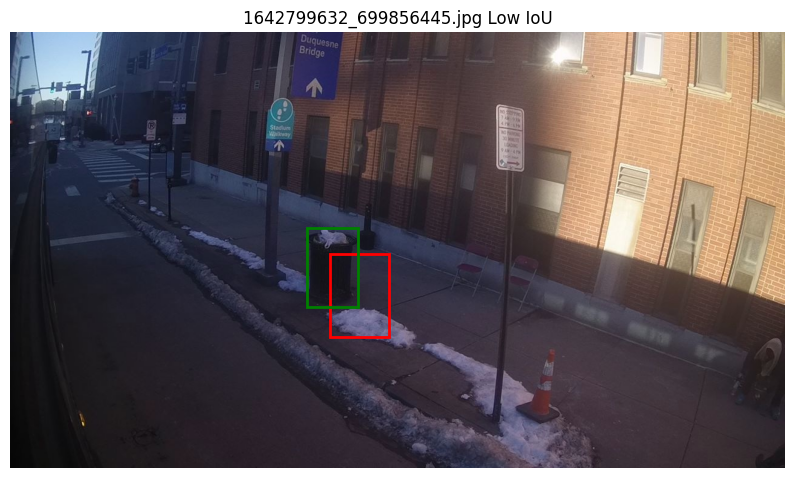

image:  1642804023_295219438.jpg


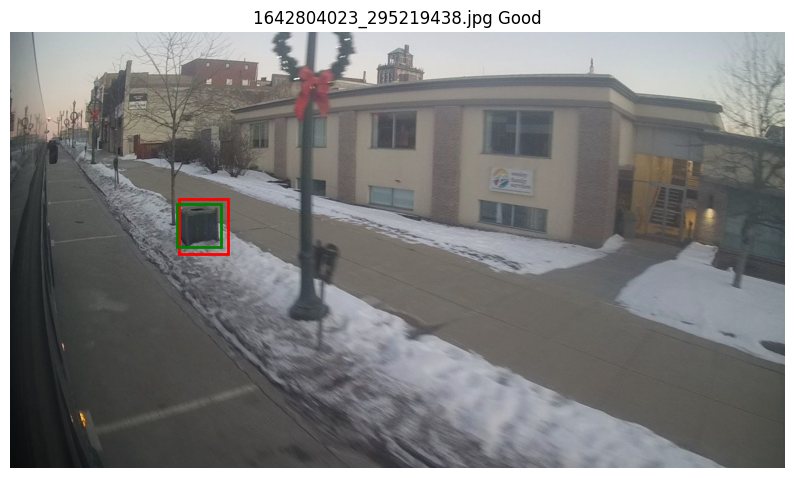

image:  1642802058_700671735.jpg


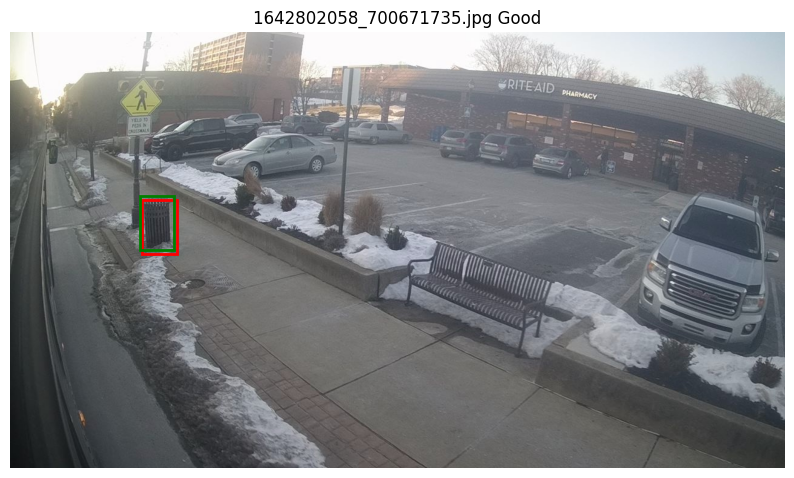

image:  1642804066_700761922.jpg


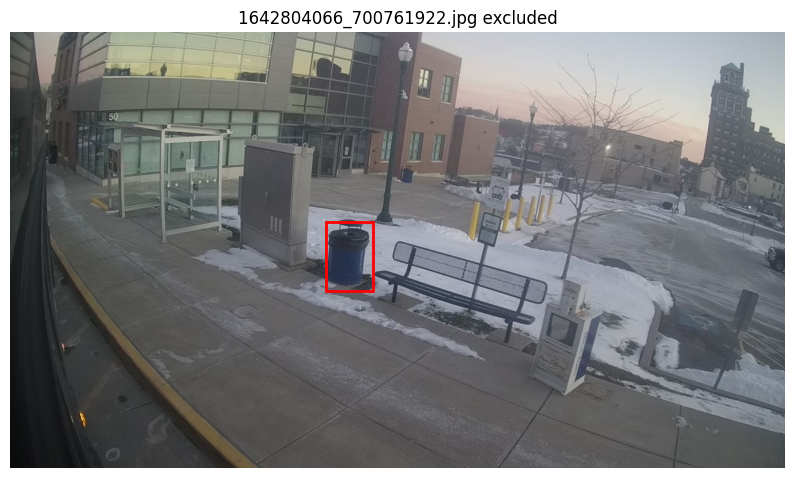

image:  1642793686_823300842.jpg


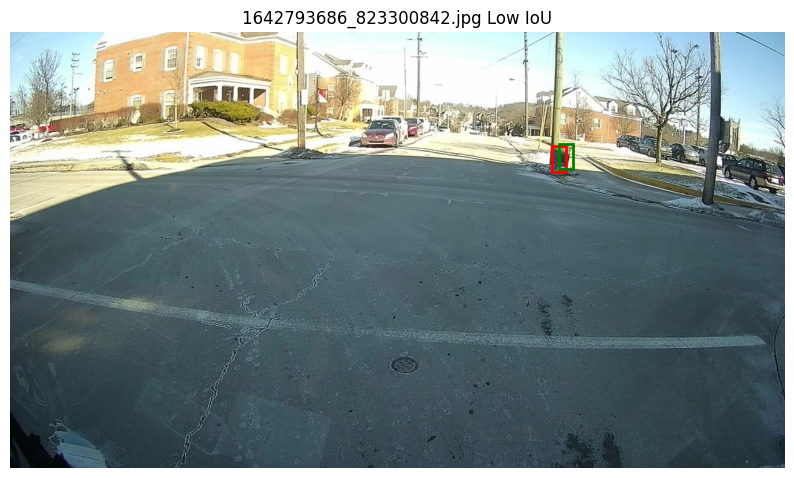

image:  1642804403_499410972.jpg


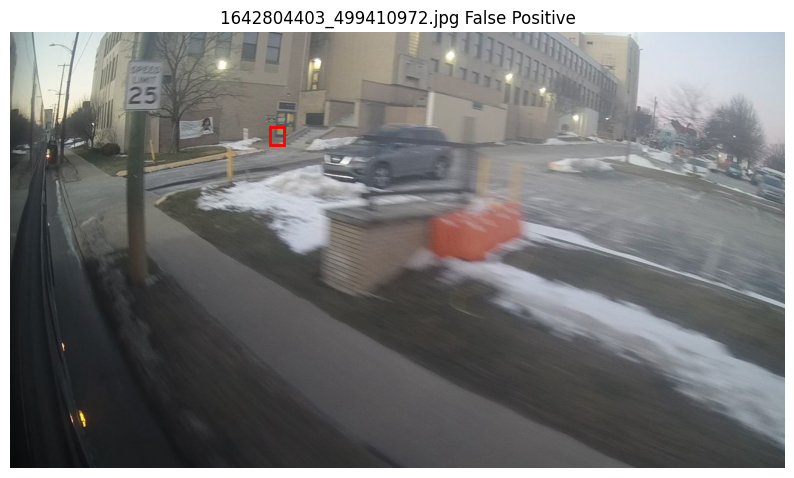

image:  1642794993_026760267.jpg


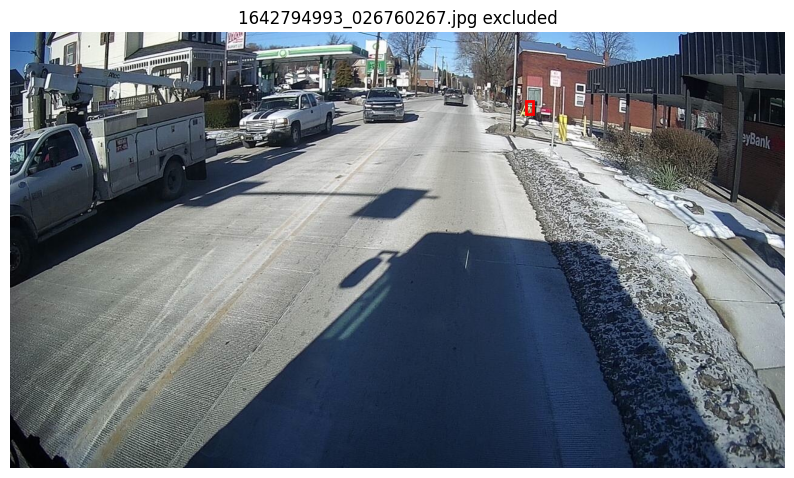

image:  1642795257_899259814.jpg


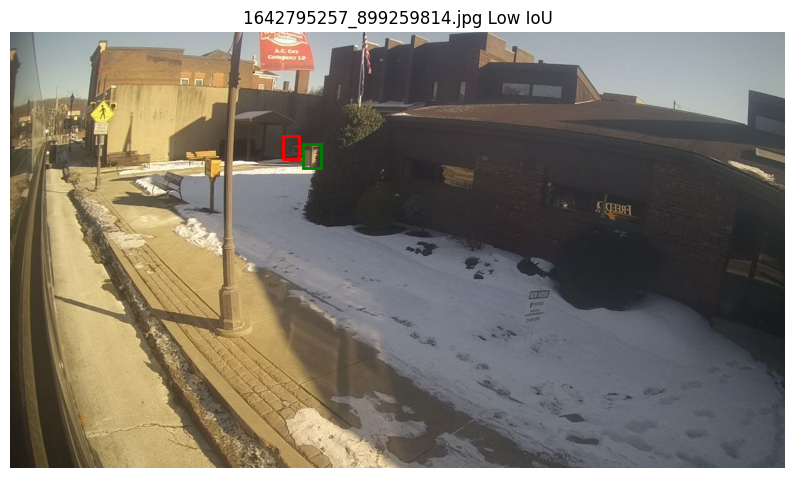

image:  1642795267_101047645.jpg


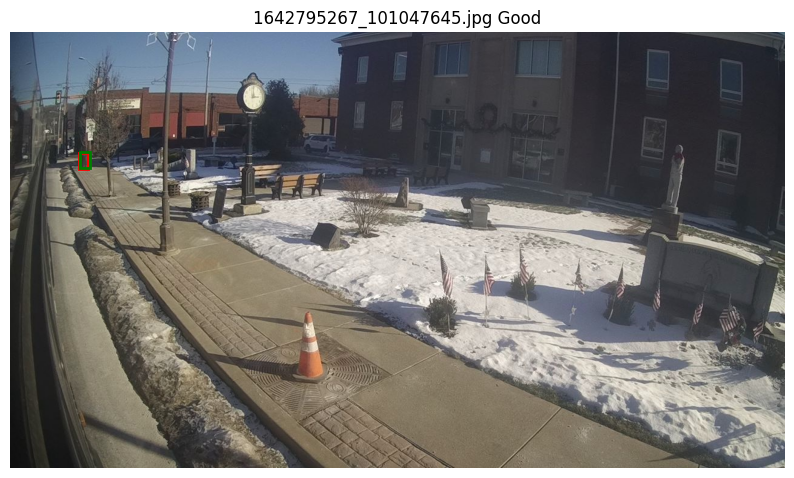

image:  1642795261_622810749.jpg


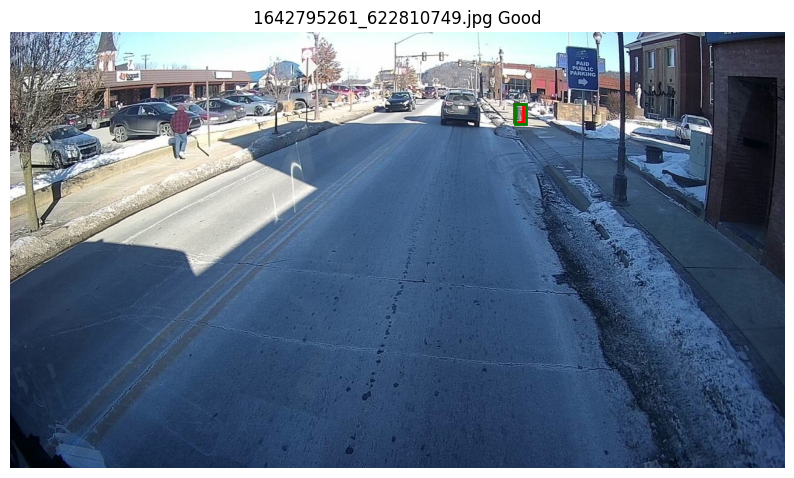

image:  1642797285_224633239.jpg


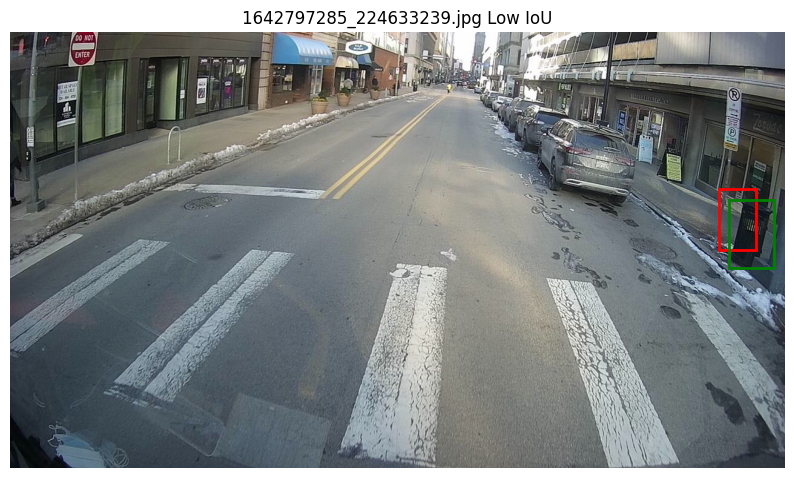

image:  1642799008_295515473.jpg


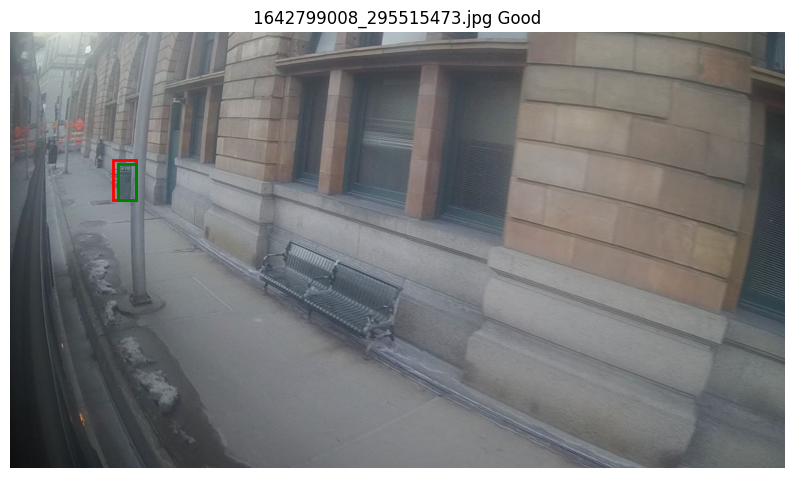

image:  1642799008_099713063.jpg


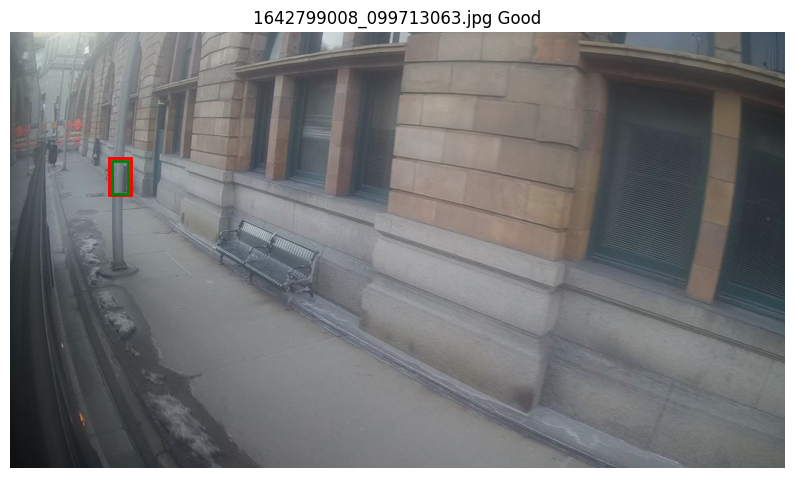

image:  1642799159_898986254.jpg


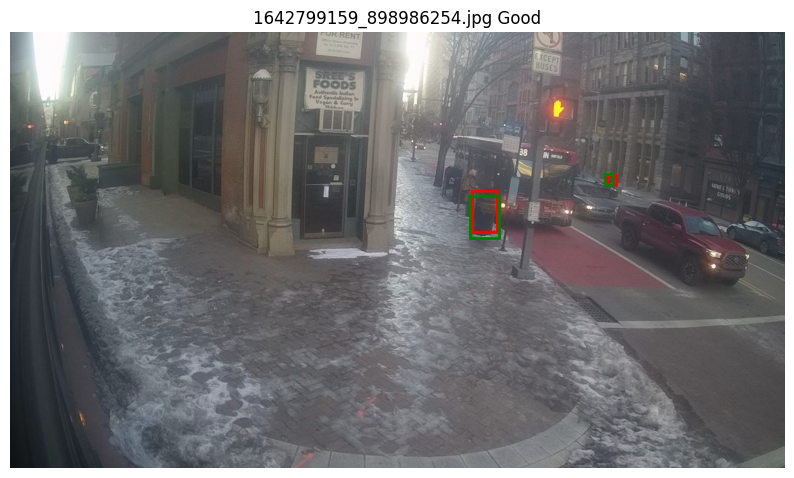

image:  1642799153_901324206.jpg


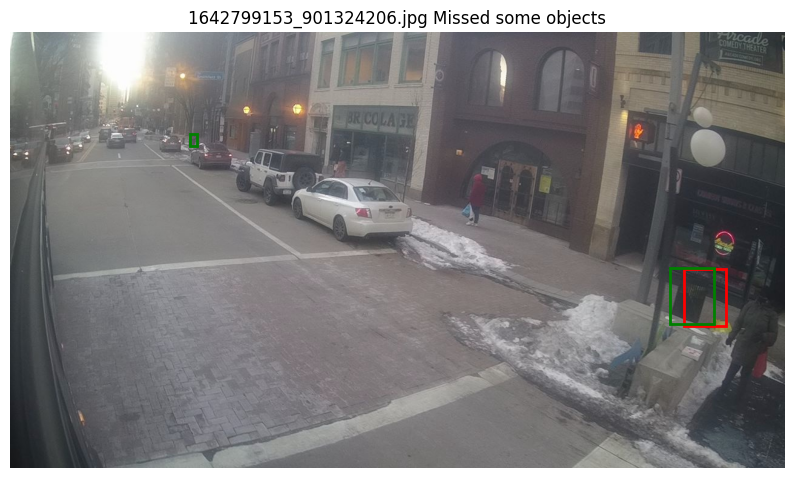

In [19]:
# draw the generated labels
if True:
    # Show the labels
    for image in generated_labels["images"]:
        img_path = generated_labels_path + run + image["file_name"]
        img = plt.imread(img_path)
        fig, axis = plt.subplots(1, figsize=(10,10))
        axis.imshow(img)
        # add the image name as the title
        axis.set_title(img_path.split("/")[-1] + " " + individual_image_results.get(img_path.split("/")[-1], "excluded"))
        print("image: ", img_path.split("/")[-1])
        axis.axis('off')
        for label in generated_labels["annotations"]:
            if label["image_id"] == image["id"]:
                x, y, w, h = label["bbox"]
                # print("Drawing box: ", x, y, w, h)
                rect = plt.Rectangle((x, y), w, h, fill=False, edgecolor='red', linewidth=2)
                axis.add_patch(rect)
        # draw in the gt labels if they exist
        for image in label_writer.annotation_dict["images"]:
            if image["file_name"].split("/")[-1] == img_path.split("/")[-1]:
                img_id = image["id"]
                for label in label_writer.annotation_dict["annotations"]:
                    if label["image_id"] == img_id:
                        x, y, w, h = label["bbox"]
                        # print("Drawing box: ", x, y, w, h)
                        rect = plt.Rectangle((x, y), w, h, fill=False, edgecolor='green', linewidth=2)
                        axis.add_patch(rect)
        plt.show()

In [14]:
# reset the generated labels (delete the file)
# if True and input("Do you want to delete the hand-labeled annotations? (y/n) ") == "y":
#     os.remove(annotation_file_name)
#     print("Deleted the hand-labeled annotations")


In [15]:
# import cv2
# import numpy as np

# class ImageAnnotator:
# # Function to handle mouse events
# def draw_rectangle(event, x, y, flags, param):
#     global top_left_pt, bottom_right_pt, drawing, image, clone

#     if event == cv2.EVENT_LBUTTONDOWN:
#         drawing = True
#         top_left_pt = (x, y)

#     elif event == cv2.EVENT_LBUTTONUP:
#         drawing = False
#         bottom_right_pt = (x, y)

#     if drawing:
#         # Draw the rectangle on the clone image
#         clone = image.copy()
#         cv2.rectangle(clone, top_left_pt, (x, y), (0, 255, 0), 2)

#     cv2.imshow('Image', clone)

# def label_image(image_path):
#     image = cv2.imread(image_path)
#     clone = image.copy()

#     # Create a window and set the callback function
#     cv2.namedWindow('Image')
#     cv2.setMouseCallback('Image', draw_rectangle)

#     top_left_pt, bottom_right_pt = (-1, -1), (-1, -1)
#     drawing = False

#     while True:
#         cv2.imshow('Image', clone)
#         key = cv2.waitKey(1) & 0xFF

#         # Press 'q' to exit the application
#         if key == ord('q'):
#             break
        
#         # Press 's' to save the annotation
#         if key == ord('s'):
#             # Save the bounding box
#             print("top_left_pt: ", top_left_pt)
#             print("bottom_right_pt: ", bottom_right_pt)
#             # print("image_path: ", image_path)
#             print("image: ", image.shape)
#             # print("clone: ", clone)

#         # Press 'r' to reset the bounding box
#         elif key == ord('r'):
#             clone = image.copy()
#             top_left_pt, bottom_right_pt = (-1, -1), (-1, -1)

#     # Save the labeled image
#     output_path = '../outputs/gt_label_viz/'
#     if not os.path.exists(output_path):
#         os.makedirs(output_path)
#     output_path = output_path + image_path.split("/")[-1]
#     cv2.imwrite(output_path, clone)

#     # Clean up
#     cv2.destroyAllWindows()


In [16]:
# def plot_results(results, title, save_path=None):
#     # plot the results
#     fig, ax = plt.subplots()
#     ax.bar(results.keys(), results.values())
#     ax.set_title(title)

#     # color the tp green, fp red and fn orange
#     ax.patches[0].set_facecolor('g')
#     ax.patches[1].set_facecolor('r')
#     ax.patches[2].set_facecolor('orange')

#     # add the numbers to the bars
#     for i, v in enumerate(results.values()):
#         # ax.text(i - 0.05, v + 0.5, str(v))
#         # center the text in the middle of the bar
#         ax.text(i, v + 0.5, str(v), color='black', ha='center')

#     plt.show()
#     if save_path is not None:
#         fig.savefig(save_path) # TODO

# def combine_categories(results, cat1, cat2, new_title):
#     # combine two categories into one
#     results[new_title] = results[cat1] + results[cat2]
#     del results[cat1]
#     del results[cat2]

# categorie_to_titles = {
#     "Good": "TP",
#     "Low IoU": "Low IoU",
#     "Missed": "FN",
#     "False Positive": "FP",
#     "Missed but nearby label exists": "Missed but nearby label exists",
#     "Missed some objects": "Missed some objects"
# }

# def combine_to_tp_fp_fn(results):
#     # combine all categories into TP, FP and FN
#     tp = 0
#     fp = 0
#     fn = 0
#     for cat in results:
#         if cat == "Good":
#             tp += results[cat]
#         elif cat == "False Positive":
#             fp += results[cat]
#         elif cat == "Missed" or cat == "Missed some objects" or cat == "Missed but nearby label exists" or cat == "Low IoU":
#             fn += results[cat]
#         else:
#             print("ERROR: unknown category: ", cat)

#     new_results = {}
#     new_results["TP"] = tp
#     new_results["FP"] = fp
#     new_results["FN"] = fn
#     return new_results
#     # for cat in results:
#     #     if cat != "TP" and cat != "FP" and cat != "FN":
#     #         del results[cat]

# results = combine_to_tp_fp_fn(results_all_images_used_labels)
# plot_results(results, "All images used, labels")

# # TODO: How to show how many FN are due to missing labels and how many are due to low IoU/missing but nearby label exists?